## SOYKOK Aylin 28711545
## CELIK Simay 28713301

# Warning :
# Do "File -> Save a copy in Drive" before you start modifying the notebook, otherwise your modifications will not be saved.


In [49]:
import argparse
import os
import time

import PIL
from PIL import Image

import numpy as np
import torchvision
import pickle

import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.utils.data
import torchvision.datasets as datasets
import torchvision.models as models
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from torch.autograd import Variable

from sklearn.svm import LinearSVC

# Partie 1 : Architecture VGG16

In [2]:
#!wget https://github.com/cdancette/deep-learning-polytech-tp6-7/raw/master/tp8/imagenet_classes.pkl
!wget https://github.com/rdfia/rdfia.github.io/raw/master/data/3-a/imagenet_classes.pkl

# Bonus : Classifiez des exemples avec vgg16 et commentez le résultat dans votre rapport.
!wget --content-disposition https://unsplash.com/photos/gKXKBY-C-Dk/download?force=true -O cat.jpg
!wget --content-disposition https://unsplash.com/photos/qO-PIF84Vxg/download?force=true -O dog.jpg

--2024-12-21 18:42:49--  https://github.com/rdfia/rdfia.github.io/raw/master/data/3-a/imagenet_classes.pkl
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/rdfia/rdfia.github.io/master/data/3-a/imagenet_classes.pkl [following]
--2024-12-21 18:42:49--  https://raw.githubusercontent.com/rdfia/rdfia.github.io/master/data/3-a/imagenet_classes.pkl
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 35454 (35K) [text/plain]
Saving to: ‘imagenet_classes.pkl’

imagenet_classes.pk 100%[===================>]  34.62K  --.-KB/s    in 0.001s  

2024-12-21 18:42:49 (60.6 MB/s) - ‘imagenet_classes.pkl’ saved [3

Prediction: Egyptian cat


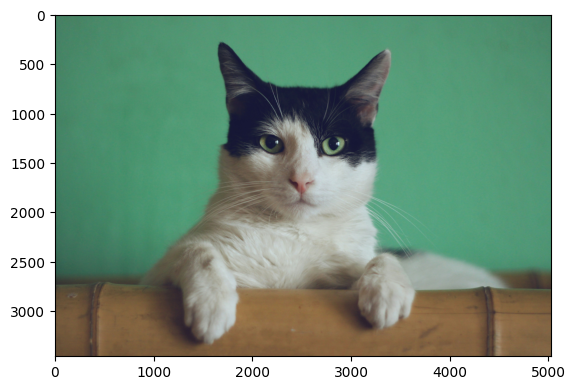

In [31]:
nameim = "cat"+".jpg"
#cat = Image.open('cat.jpg')
img = Image.open(nameim)
plt.imshow(img)

# Loading ImageNet classes
imagenet_classes = pickle.load(open('imagenet_classes.pkl', 'rb'))

# Normalization
img = img.resize((224, 224), Image.BILINEAR)
img = np.array(img, dtype=np.float32) / 255
img = img.transpose((2, 0, 1))
# ImageNet mean/std
mu = torch.Tensor([0.485, 0.456, 0.406])
sigma = torch.Tensor([0.229, 0.224, 0.225])
# Expand mu & sigma to match image size
# YOUR CODE HERE
mu = mu.view(3, 1, 1) # channels height width dimensions
sigma = sigma.view(3, 1, 1)
# compute the normalized image with mean ImageNet image
# img = YOUR CODE HERE
img =  transforms.Normalize(mu, sigma)(torch.Tensor(img))

# Loding pre-trained VGG
vgg16 = torchvision.models.vgg16(pretrained=True)
vgg16.eval() # WHY THAT ?

# Forward pass on VGG
img = np.expand_dims(img, 0)
x = torch.Tensor(img)
y = vgg16(x).detach()# TODO calcul forward
y = y.numpy() # transformation en array numpy

# Get prediction (i.e., ImageNet class label)
# YOUR CODE HERE
pred = np.argmax(y)
print(f'Prediction: {imagenet_classes[pred]}')

Image: Cow toy	| Prediction: dalmatian, coach dog, carriage dog
Image: Baboon	| Prediction: baboon
Image: Barbara	| Prediction: rocking chair, rocker
Image: Dog	| Prediction: wire-haired fox terrier


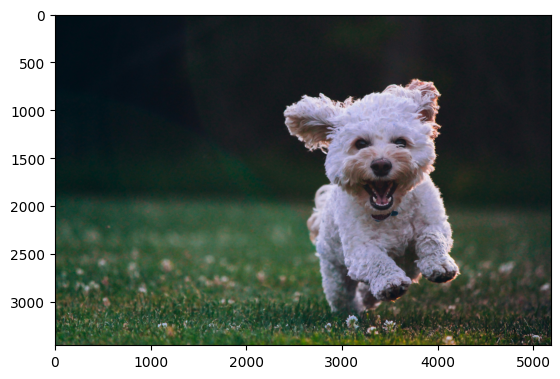

In [32]:
#Question 3
images = [('Cow toy',"images/cowey.png"),('Baboon',"images/love_baboon.png"),('Barbara',"images/love_barbara.jpg"),('Dog',"dog.jpg")]
for imgname, im in images:
    img = Image.open(im)
    if img.mode != 'RGB':
        img = img.convert('RGB')
        #plt.imshow(img)
    plt.imshow(img)
    # Loading ImageNet classes
    imagenet_classes = pickle.load(open('imagenet_classes.pkl', 'rb'))

    # Normalization
    img = img.resize((224, 224), Image.BILINEAR)
    img = np.array(img, dtype=np.float32) / 255
    img = img.transpose((2, 0, 1))
    # ImageNet mean/std
    mu = torch.Tensor([0.485, 0.456, 0.406])
    sigma = torch.Tensor([0.229, 0.224, 0.225])
    # Expand mu & sigma to match image size
    # YOUR CODE HERE
    mu = mu.view(3, 1, 1) # channels height width dimensions
    sigma = sigma.view(3, 1, 1)
    # compute the normalized image with mean ImageNet image
    # img = YOUR CODE HERE
    img =  transforms.Normalize(mu, sigma)(torch.Tensor(img))

    # Loding pre-trained VGG
    vgg16 = torchvision.models.vgg16(pretrained=True)
    vgg16.eval() # WHY THAT ?

    # Forward pass on VGG
    img = np.expand_dims(img, 0)
    x = torch.Tensor(img)
    y = vgg16(x).detach()# TODO calcul forward
    y = y.numpy() # transformation en array numpy

    # Get prediction (i.e., ImageNet class label)
    # YOUR CODE HERE
    pred = np.argmax(y)
    print(f'Image: {imgname}\t| Prediction: {imagenet_classes[pred]}')


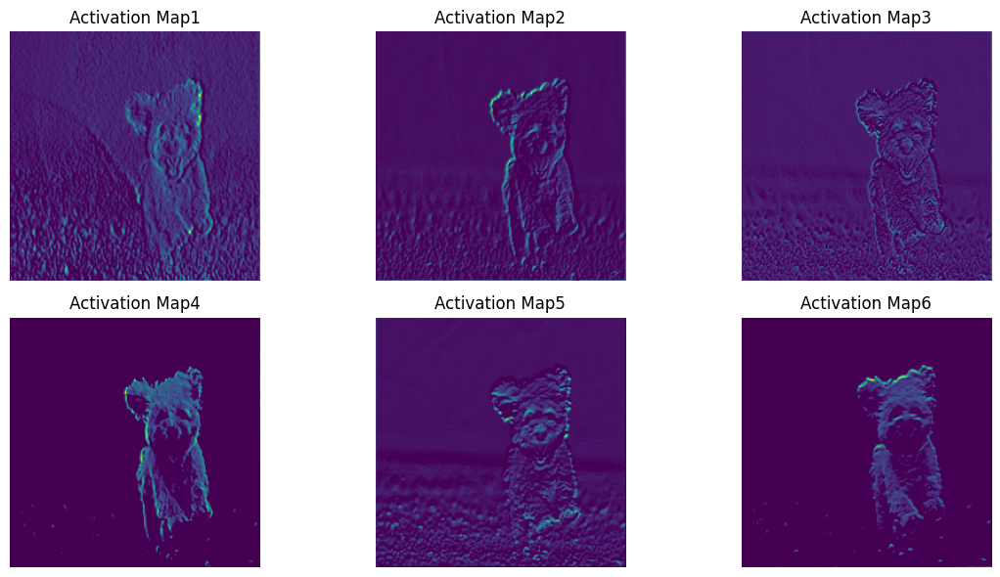

In [33]:
activation_maps = {}


layer = 'convolution_1'
def hook_fn(module, input, output):
    global layer
    activation_maps[layer] = output

#hook the first layer
conv1_layer = vgg16.features[0]
conv1_layer.register_forward_hook(hook_fn)

output = vgg16(x)

activations = activation_maps[layer].squeeze(0).detach().numpy()

plt.figure(figsize=(12, 6))
for i in range(6):
    plt.subplot(2, 3, i+1)
    plt.imshow(activations[i])
    plt.axis('off')
    plt.title(f'Activation Map{i+1}')
plt.tight_layout()
plt.show()


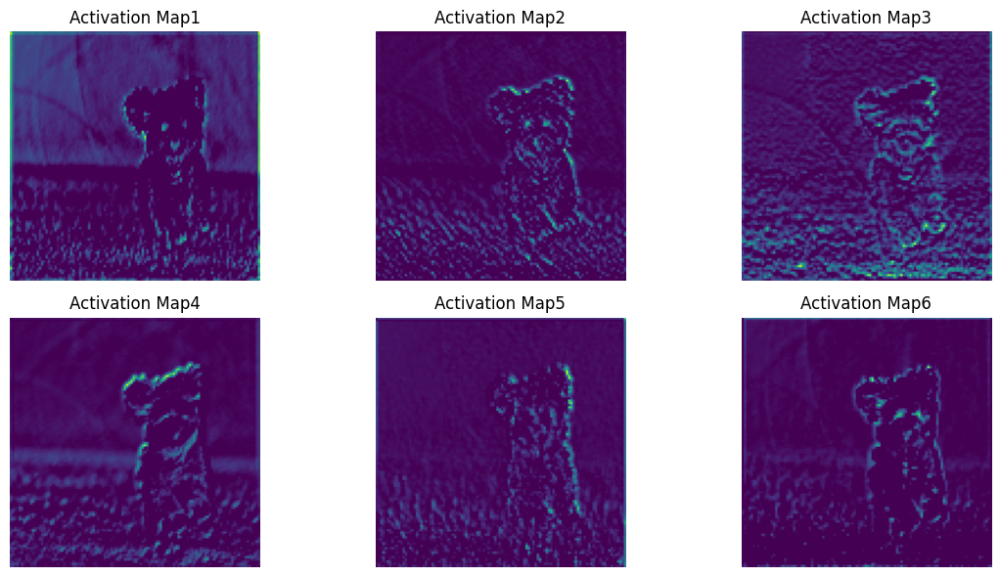

In [34]:
layer = 'convolution_2'
conv1_layer = vgg16.features[5] #should correspond to the 2nd conv layer
conv1_layer.register_forward_hook(hook_fn)

output = vgg16(x)

activations = activation_maps[layer].squeeze(0).detach().numpy()


plt.figure(figsize=(12, 6))
for i in range(6):
    plt.subplot(2, 3, i+1)
    plt.imshow(activations[i])
    plt.axis('off')
    plt.title(f'Activation Map{i+1}')
plt.tight_layout()
plt.show()

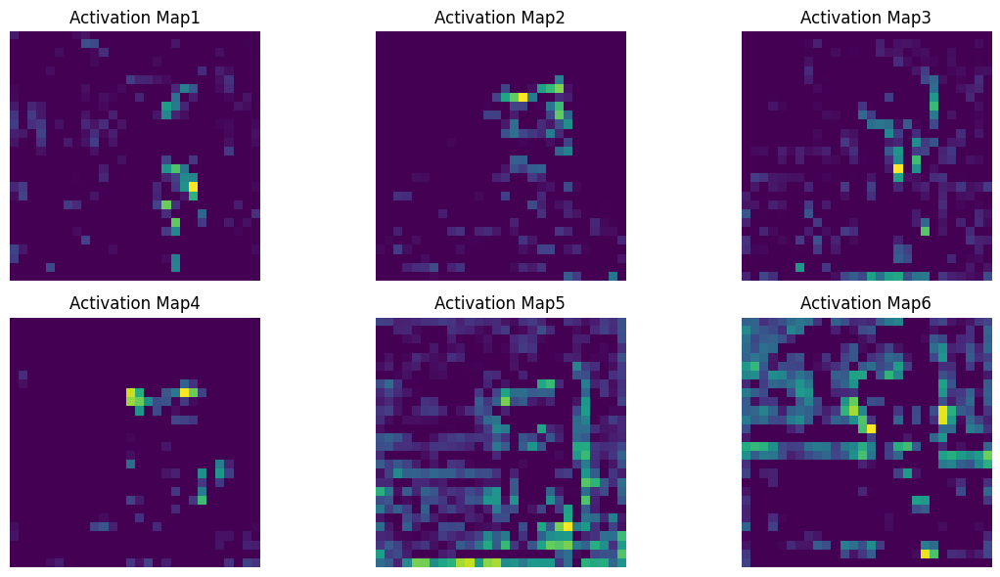

In [35]:
layer = 'convolution_last'
conv1_layer = vgg16.features[16] #should correspond to the last conv layer
conv1_layer.register_forward_hook(hook_fn)

output = vgg16(x)

activations = activation_maps[layer].squeeze(0).detach().numpy()

plt.figure(figsize=(12, 6))
for i in range(6):
    plt.subplot(2, 3, i+1)
    plt.imshow(activations[i])
    plt.axis('off')
    plt.title(f'Activation Map{i+1}')
plt.tight_layout()
plt.show()

# Partie 2: Transfer Learning avec VGG16 sur 15 Scene

In [25]:
#!wget https://github.com/cdancette/deep-learning-polytech-tp6-7/raw/master/tp8/15ScenesData.zip
!wget https://github.com/rdfia/rdfia.github.io/raw/master/data/3-a/15ScenesData.zip

!unzip 15ScenesData.zip

--2024-12-21 18:46:35--  https://github.com/rdfia/rdfia.github.io/raw/master/data/3-a/15ScenesData.zip
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/rdfia/rdfia.github.io/master/data/3-a/15ScenesData.zip [following]
--2024-12-21 18:46:36--  https://raw.githubusercontent.com/rdfia/rdfia.github.io/master/data/3-a/15ScenesData.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 86520868 (83M) [application/zip]
Saving to: ‘15ScenesData.zip.1’

15ScenesData.zip.1  100%[===================>]  82.51M   424MB/s    in 0.2s    

2024-12-21 18:46:36 (424 MB/s) - ‘15ScenesData.zip.1’ saved [86520868/8

In [26]:
ls 15SceneData/test/bedroom/

image_0003.jpg  image_0035.jpg  image_0068.jpg  image_0103.jpg  image_0141.jpg  image_0182.jpg
image_0004.jpg  image_0037.jpg  image_0069.jpg  image_0104.jpg  image_0142.jpg  image_0189.jpg
image_0006.jpg  image_0039.jpg  image_0071.jpg  image_0112.jpg  image_0144.jpg  image_0190.jpg
image_0007.jpg  image_0040.jpg  image_0073.jpg  image_0113.jpg  image_0148.jpg  image_0191.jpg
image_0008.jpg  image_0042.jpg  image_0074.jpg  image_0114.jpg  image_0150.jpg  image_0192.jpg
image_0011.jpg  image_0043.jpg  image_0077.jpg  image_0115.jpg  image_0152.jpg  image_0195.jpg
image_0013.jpg  image_0047.jpg  image_0080.jpg  image_0117.jpg  image_0153.jpg  image_0196.jpg
image_0014.jpg  image_0049.jpg  image_0081.jpg  image_0118.jpg  image_0156.jpg  image_0200.jpg
image_0016.jpg  image_0050.jpg  image_0082.jpg  image_0119.jpg  image_0157.jpg  image_0202.jpg
image_0017.jpg  image_0052.jpg  image_0084.jpg  image_0120.jpg  image_0158.jpg  image_0203.jpg
image_0018.jpg  image_0053.jpg  image_0086.jpg  im

In [27]:
class VGG16relu7(nn.Module):
    def __init__(self):
        super(VGG16relu7, self).__init__()
        # Copy the entire convolutional part
        self.features = nn.Sequential( *list(vgg16.features.children()))
        # Keep a piece of the classifier: -2 to stop at relu7
        self.classifier = nn.Sequential(*list(vgg16.classifier.children())[:-2])

    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x


In [28]:
PRINT_INTERVAL = 50
CUDA = True

def get_dataset(batch_size, path):

    # This function expands 3 times a gray level image
    # to transform it into an image RGB. Use it with transform.Lambda
    def duplicateChannel(img):
        img = img.convert('L')
        np_img = np.array(img, dtype=np.uint8)
        np_img = np.dstack([np_img, np_img, np_img])
        img = Image.fromarray(np_img, 'RGB')
        return img
    def resizeImage(img):
      return img.resize((224,224), Image.BILINEAR)

    #####################
    ## YOUR CODE HERE  ##
    #####################
    # Add pre-processing
    global mu
    global sigma
    train_dataset = datasets.ImageFolder(path+'/train',
        transform=transforms.Compose([
            transforms.Lambda(duplicateChannel),
            transforms.Lambda(resizeImage),
            transforms.ToTensor(),
            transforms.Normalize(mean=mu, std=sigma)
        ]))
     # Pre-processing TODO: duplicateChannel(), resizeImage(), toTensor(), Normalize ()
    val_dataset = datasets.ImageFolder(path+'/test',
        transform=transforms.Compose([
            transforms.Lambda(duplicateChannel),
            transforms.Lambda(resizeImage),
            transforms.ToTensor(),
            transforms.Normalize(mean=mu, std=sigma)
        ]))
    ####################
    ##      END        #
    ####################

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=CUDA, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=CUDA, num_workers=2)

    return train_loader, val_loader

In [36]:
def extract_features(data, model):
    #####################
    ## YOUR CODE HERE  ##
    #####################
    # init features matrices
    X = []
    y = []

    ####################
    ##      END        #
    ####################

    for i, (input, target) in enumerate(data):
        if i % PRINT_INTERVAL == 0:
            print('Batch {0:03d}/{1:03d}'.format(i, len(data)))
        if CUDA:
            input = input.cuda()
        #####################
        ## YOUR CODE HERE  ##
        #####################
        # Feature extraction à faire
        with torch.no_grad():
            output = model(input)
        # X.append(output)
        # y.append(target)
        X.extend(output.cpu().numpy())
        y.extend(target.numpy())

        ####################
        ##      END        #
        ####################

    return np.array(X), np.array(y)


def main(path="15SceneData", batch_size=8):
    tick = time.time()

    print('Instanciation de VGG16')
    vgg16 = models.vgg16(pretrained=True)

    print('Instanciation de VGG16relu7')
    #####################
    ## YOUR CODE HERE  ##
    #####################
    # Remplacer par le modèle par un réseau tronqué pour faire de la feature extraction
    # On créera une nouvelle classe VGG16relu7 ici
    model = VGG16relu7()
    #model.load_state_dict(vgg16.state_dict(), strict=False)
    ####################
    ##      END        #
    ####################

    model.eval()
    if CUDA: # si on fait du GPU, passage en CUDA
        cudnn.benchmark = True
        model = model.cuda()

    # On récupère les données
    print('Récupération des données')
    train, test = get_dataset(batch_size, path)

    # Extraction des features
    print('Feature extraction')
    X_train, y_train = extract_features(train, model)
    X_test, y_test = extract_features(test, model)

    #####################
    ## Votre code ici  ##
    #####################


    # Apprentissage et évaluation des SVM à faire
    print('Apprentissage des SVM')
    svm = LinearSVC(C=1.0)
    svm.fit(X_train, y_train)
    accuracy = 0
    accuracy = svm.score(X_test, y_test)
    ####################
    ##      FIN        #
    ####################
    print('Accuracy = %f' % accuracy)
    tock = time.time()
    print(f"Main for relu7 took {tock - tick:.4f}")


In [37]:
main("15SceneData", 8)

Instanciation de VGG16
Instanciation de VGG16relu7
Récupération des données
Feature extraction
Batch 000/188
Batch 050/188
Batch 100/188
Batch 150/188
Batch 000/374
Batch 050/374
Batch 100/374
Batch 150/374
Batch 200/374
Batch 250/374
Batch 300/374
Batch 350/374
Apprentissage des SVM
Accuracy = 0.885762
Main for relu7 took 38.6299


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1243: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [38]:
# function to predict classes and
def predict_image(image_path, model, svm, class_names):
    img = Image.open(image_path).convert("RGB")
    img = img.resize((224, 224), Image.BILINEAR)
    img = np.array(img, dtype=np.float32) / 255.0
    img = img.transpose((2, 0, 1))
    img = torch.tensor(img, dtype=torch.float32)

    mu = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    sigma = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    img = (img - mu) / sigma
    img = img.unsqueeze(0)

    if CUDA:
        img = img.cuda()

    model.eval()
    with torch.no_grad():
        features = model(img).cpu().numpy()

    predicted_class = svm.predict(features)[0]
    plt.imshow(Image.open(image_path))
    plt.title(f"Predicted Class: {class_names[predicted_class]}")
    plt.axis("off")
    plt.show()

def main(path="15SceneData", test_image_path="/content/15SceneData/test/bedroom/image_0008.jpg",batch_size=8):
    tick = time.time()
    print('Instanciation de VGG16')
    vgg16 = models.vgg16(pretrained=True)

    print('Instanciation de VGG16relu7')
    model = VGG16relu7()

    model.eval()
    if CUDA:
        cudnn.benchmark = True
        model = model.cuda()

    print('Récupération des données')
    train_loader, test_loader = get_dataset(batch_size, path)
    train_dataset = train_loader.dataset

    print('Feature extraction')
    X_train, y_train = extract_features(train_loader, model)
    X_test, y_test = extract_features(test_loader, model)

    print('Apprentissage des SVM')
    svm = LinearSVC(C=1.0)
    svm.fit(X_train, y_train)
    tock = time.time()
    print(f"Training for relu7 took {tock - tick:.4f}")
    accuracy = svm.score(X_train,y_train)
    print('Train Accuracy = %f' % accuracy)
    accuracy = svm.score(X_test, y_test)
    print('Test Accuracy = %f' % accuracy)



    print("Testing on a single image:")
    class_names = train_dataset.classes
    tick = time.time()
    predict_image(test_image_path, model, svm, class_names)
    tock = time.time()
    print(f"Testing on a single image with relu7 took {tock - tick:.4f}")

Instanciation de VGG16


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Instanciation de VGG16relu7
Récupération des données
Feature extraction
Batch 000/188
Batch 050/188
Batch 100/188
Batch 150/188
Batch 000/374
Batch 050/374
Batch 100/374
Batch 150/374
Batch 200/374
Batch 250/374
Batch 300/374
Batch 350/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1243: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Training for relu7 took 40.4069
Train Accuracy = 1.000000
Test Accuracy = 0.885762
Testing on a single image:


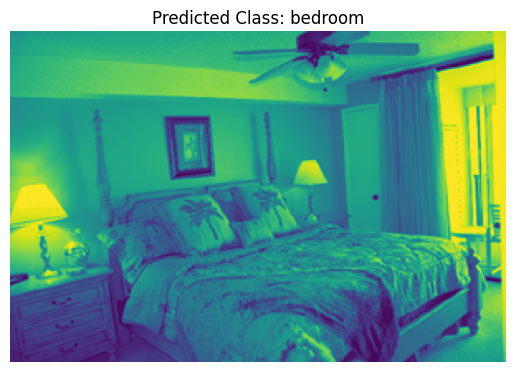

Testing on a single image with relu7 took 0.2689


In [ ]:
main()

In [39]:
import random

Instanciation de VGG16


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Instanciation de VGG16relu7
Récupération des données
Feature extraction
Batch 000/188
Batch 050/188
Batch 100/188
Batch 150/188
Batch 000/374
Batch 050/374
Batch 100/374
Batch 150/374
Batch 200/374
Batch 250/374
Batch 300/374
Batch 350/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1243: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Accuracy = 0.885762


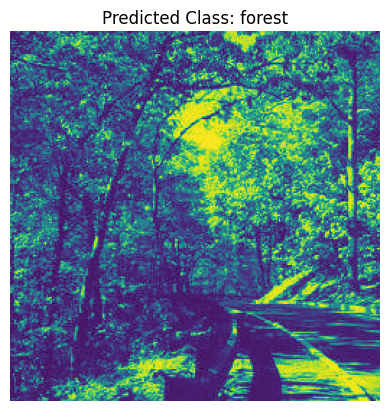

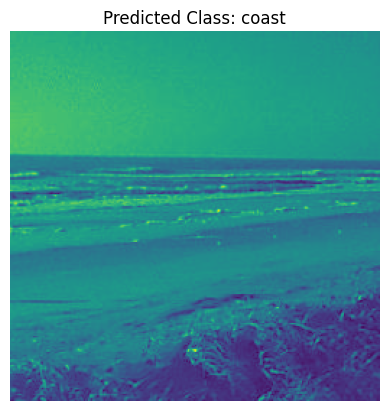

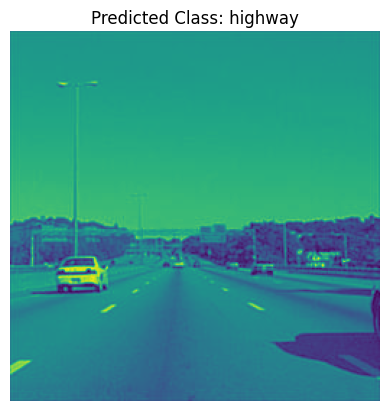

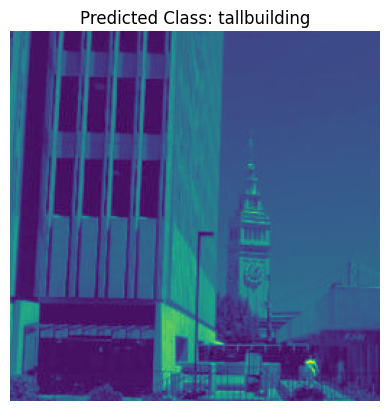

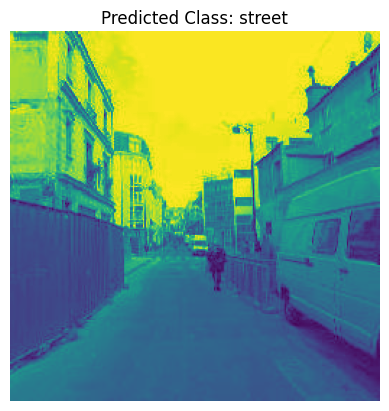

...

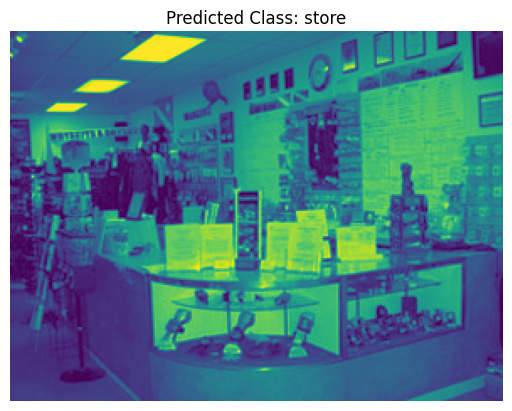

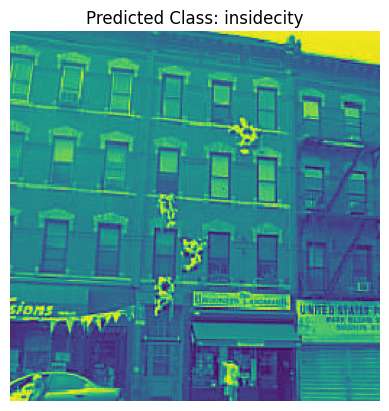

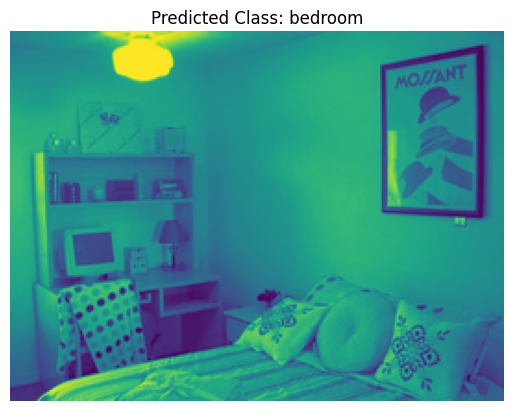

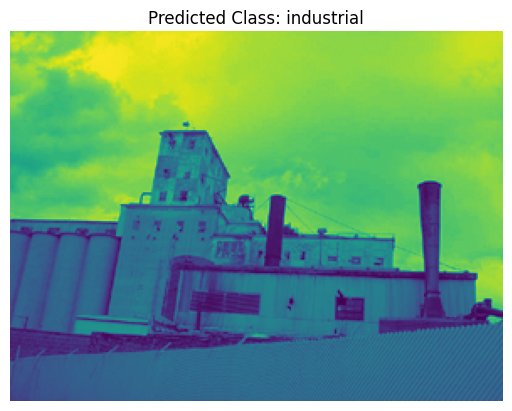

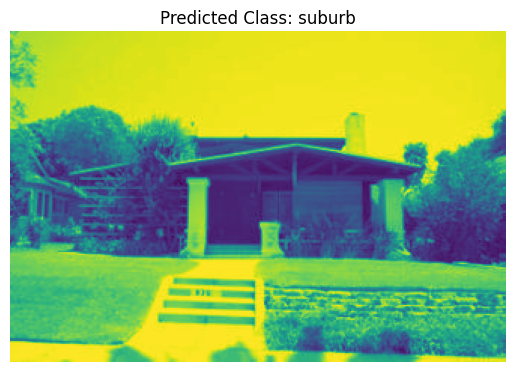

In [ ]:

#repeating the same code because I do not want to modify previous cells
batch_size=8

print('Instanciation de VGG16')
vgg16 = models.vgg16(pretrained=True)

print('Instanciation de VGG16relu7')
model = VGG16relu7()

model.eval()
if CUDA:
    cudnn.benchmark = True
    model = model.cuda()

path="15SceneData"
print('Récupération des données')
train_loader, test_loader = get_dataset(batch_size, path)
train_dataset = train_loader.dataset

print('Feature extraction')
X_train, y_train = extract_features(train_loader, model)
X_test, y_test = extract_features(test_loader, model)

print('Apprentissage des SVM')
svm = LinearSVC(C=1.0)
svm.fit(X_train, y_train)
accuracy = svm.score(X_test, y_test)
print('Accuracy = %f' % accuracy)


dataset_path = "/content/15SceneData"

image_path = []
class_dirs = [d for d in os.listdir(os.path.join(dataset_path, "test")) if os.path.isdir(os.path.join(dataset_path, "test", d))]

for class_dir in class_dirs:
    image_files = [f for f in os.listdir(os.path.join(dataset_path, "test", class_dir)) if os.path.isfile(os.path.join(dataset_path, "test", class_dir, f))]
    if image_files:
        image_path.append(os.path.join(dataset_path, "test", class_dir, random.choice(image_files)))

class_names = train_dataset.classes
for path in image_path:
    predict_image(path, model, svm, class_names)




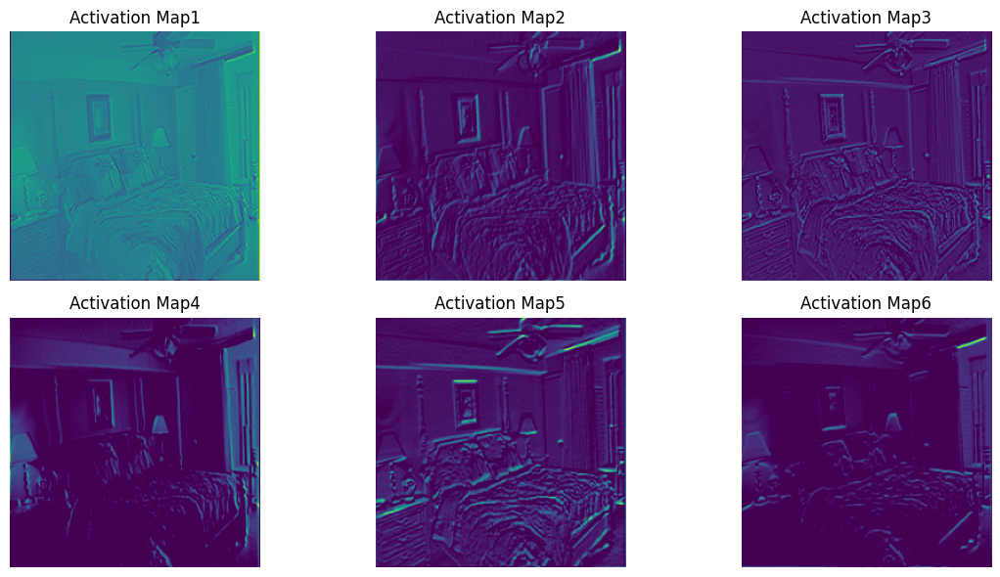

In [ ]:
activation_maps = {}


layer = 'convolution_1'
def hook_fn(module, input, output):
    global layer
    activation_maps[layer] = output

#hook the first layer
conv1_layer = model.features[0]
conv1_layer.register_forward_hook(hook_fn)

img = Image.open("/content/15SceneData/test/bedroom/image_0008.jpg").convert("RGB")
img = img.resize((224, 224), Image.BILINEAR)
img = np.array(img, dtype=np.float32) / 255.0
img = img.transpose((2, 0, 1))
img = torch.tensor(img, dtype=torch.float32)

mu = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
sigma = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
img = (img - mu) / sigma
img = img.unsqueeze(0)

if CUDA:
    img = img.cuda()

output = model(img)
activations = activation_maps[layer].squeeze(0).detach().cpu().numpy()

plt.figure(figsize=(12, 6))
for i in range(6):
    plt.subplot(2, 3, i+1)
    plt.imshow(activations[i])
    plt.axis('off')
    plt.title(f'Activation Map{i+1}')
plt.tight_layout()
plt.show()

## Going further

Change the layer at which the features are extracted. What is the importance of the depth of this
layer? What is the representation size and what does this change?

Trying relu6 and relu 5_3 which is the last convolutional layer before flattening and it contains structural features.

In [ ]:
class VGG16relu6(nn.Module):
    def __init__(self):
        super(VGG16relu6, self).__init__()
        # Copy the entire convolutional part
        self.features = nn.Sequential(*list(vgg16.features.children()))
        # Keep a piece of the classifier: -3 to stop at relu6
        self.classifier = nn.Sequential(*list(vgg16.classifier.children())[:-3])

    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x


In [ ]:
#??? Not sure if this is the right index might not include this part.
class VGG16relu4_3(nn.Module):
    def __init__(self):
        super(VGG16relu4_3, self).__init__()
        # Copy the entire convolutional part
        self.features = nn.Sequential(*list(vgg16.features.children()))
        # Keep a piece of the classifier: -3 to stop at relu4_3
        self.classifier = nn.Sequential(*list(vgg16.classifier.children())[:24])

    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

Instanciation de VGG16


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Instanciation de VGG16relu6
Récupération des données
Feature extraction
Batch 000/188
Batch 050/188
Batch 100/188
Batch 150/188
Batch 000/374
Batch 050/374
Batch 100/374
Batch 150/374
Batch 200/374
Batch 250/374
Batch 300/374
Batch 350/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1243: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Training for relu6 took 49.4845
Train Accuracy = 1.000000
Test Accuracy = 0.869682
Testing on a single image:


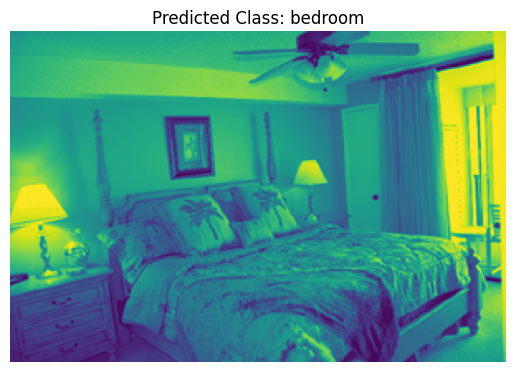

Testing on a single image with relu6 took 0.2291


In [ ]:
batch_size=8
test_image_path="/content/15SceneData/test/bedroom/image_0008.jpg"
tick= time.time()
print('Instanciation de VGG16')
vgg16 = models.vgg16(pretrained=True)

print('Instanciation de VGG16relu6')
model = VGG16relu6()

model.eval()
if CUDA:
    cudnn.benchmark = True
    model = model.cuda()

path="15SceneData"

print('Récupération des données')
train_loader, test_loader = get_dataset(batch_size, path)
train_dataset = train_loader.dataset

print('Feature extraction')
X_train, y_train = extract_features(train_loader, model)
X_test, y_test = extract_features(test_loader, model)

print('Apprentissage des SVM')
svm = LinearSVC(C=1.0)
svm.fit(X_train, y_train)
tock = time.time()
print(f"Training for relu6 took {tock - tick:.4f}")
accuracy = svm.score(X_train,y_train)
print('Train Accuracy = %f' % accuracy)
accuracy = svm.score(X_test, y_test)
print('Test Accuracy = %f' % accuracy)


print("Testing on a single image:")
class_names = train_dataset.classes
tick = time.time()
predict_image(test_image_path, model, svm, class_names)
tock = time.time()
print(f"Testing on a single image with relu6 took {tock - tick:.4f}")


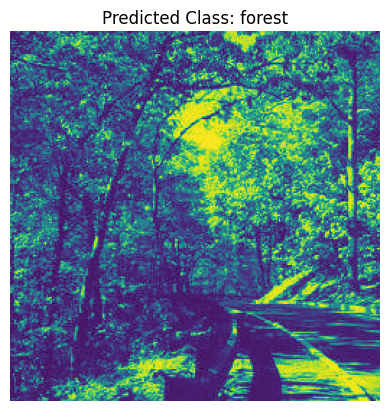

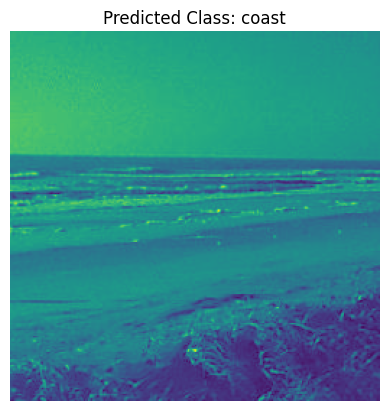

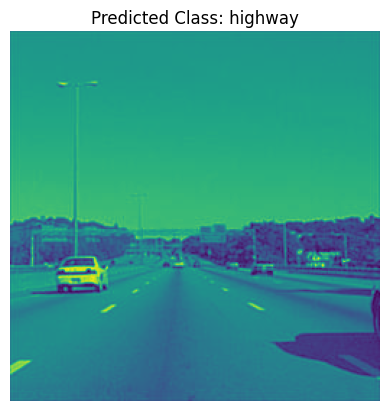

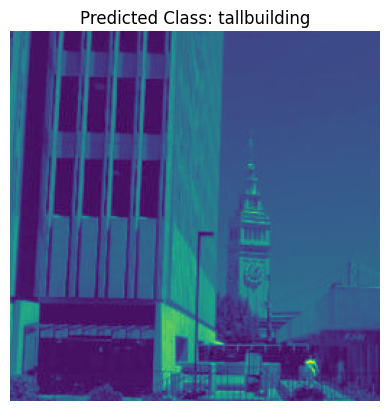

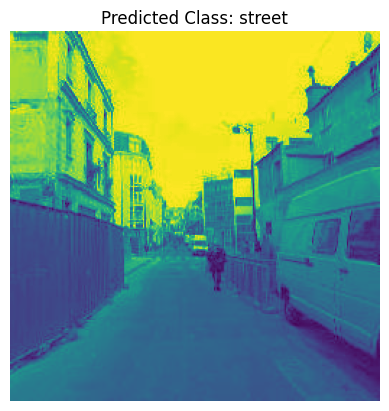

...

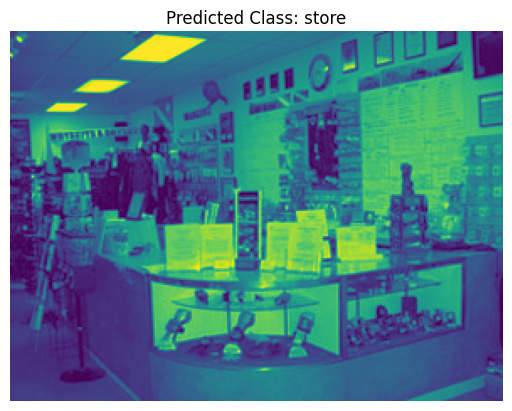

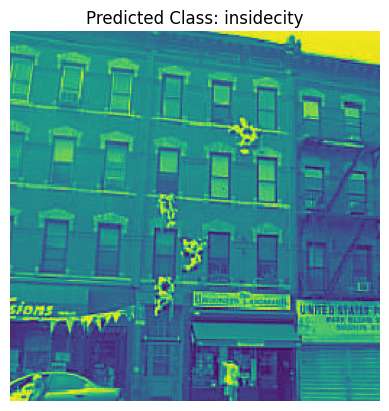

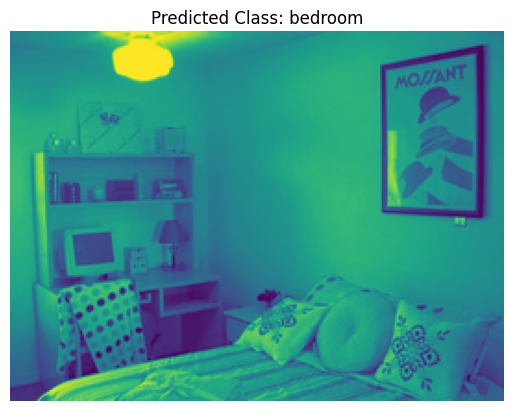

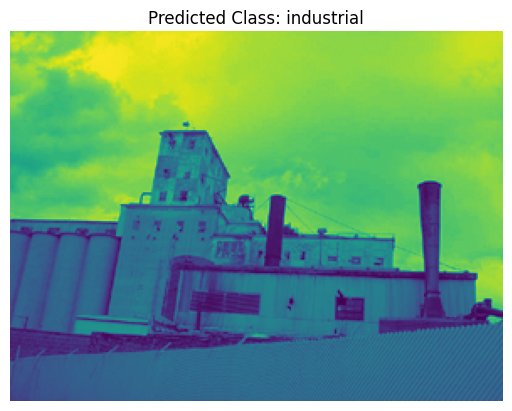

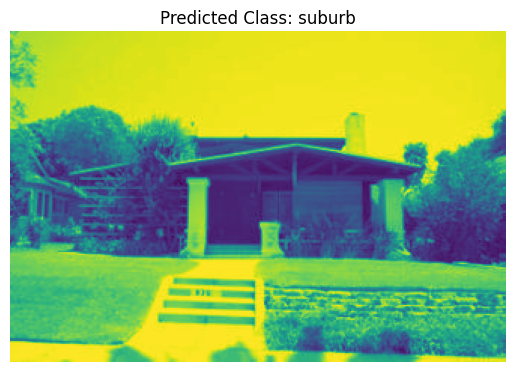

In [ ]:
for path in image_path:
    predict_image(path, model, svm, class_names)

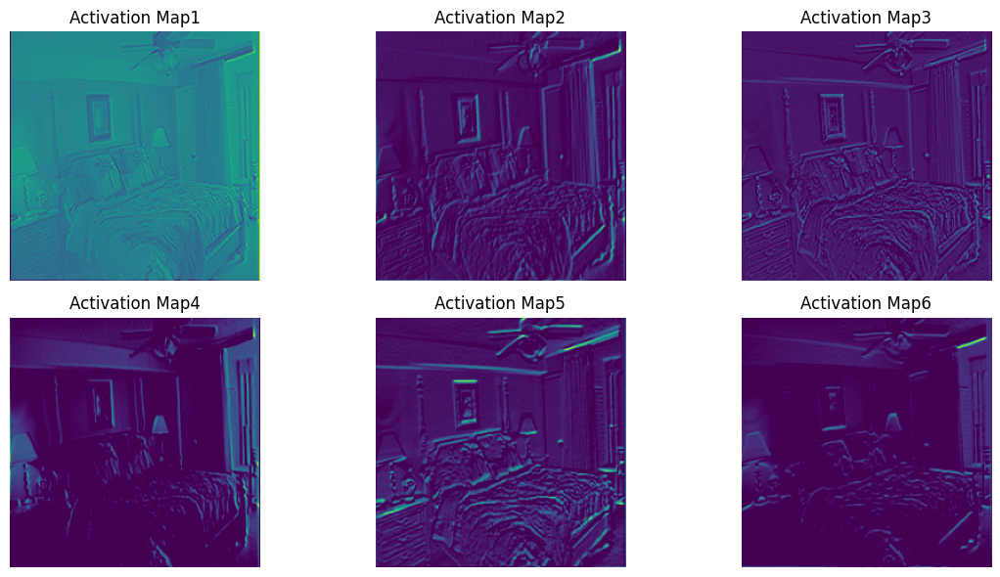

In [ ]:
activation_maps = {}

layer = 'convolution_1'
def hook_fn(module, input, output):
    global layer
    activation_maps[layer] = output

#hook the last layer
conv1_layer = model.features[0]
conv1_layer.register_forward_hook(hook_fn)

img = Image.open("/content/15SceneData/test/bedroom/image_0008.jpg").convert("RGB")
img = img.resize((224, 224), Image.BILINEAR)
img = np.array(img, dtype=np.float32) / 255.0
img = img.transpose((2, 0, 1))
img = torch.tensor(img, dtype=torch.float32)

mu = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
sigma = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
img = (img - mu) / sigma
img = img.unsqueeze(0)

if CUDA:
    img = img.cuda()

output = model(img)
activations = activation_maps[layer].squeeze(0).detach().cpu().numpy()

plt.figure(figsize=(12, 6))
for i in range(6):
    plt.subplot(2, 3, i+1)
    plt.imshow(activations[i])
    plt.axis('off')
    plt.title(f'Activation Map{i+1}')
plt.tight_layout()
plt.show()

Instanciation de VGG16


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Instanciation de VGG16relu4_3
Récupération des données
Feature extraction
Batch 000/188
Batch 050/188
Batch 100/188
Batch 150/188
Batch 000/374
Batch 050/374
Batch 100/374
Batch 150/374
Batch 200/374
Batch 250/374
Batch 300/374
Batch 350/374
Apprentissage des SVM
Training for relu4_3 took 41.9435
Train Accuracy = 1.000000
Test Accuracy = 0.850921
Testing on a single image:


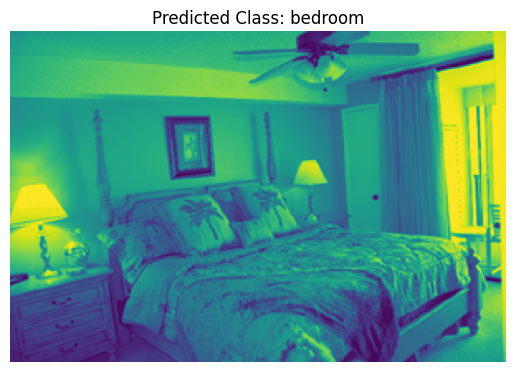

Testing on a single image with relu4_3 took 0.2294


In [ ]:
batch_size=8
tick= time.time()
print('Instanciation de VGG16')
vgg16 = models.vgg16(pretrained=True)

print('Instanciation de VGG16relu4_3')
model = VGG16relu4_3()

model.eval()
if CUDA:
    cudnn.benchmark = True
    model = model.cuda()

path="15SceneData"
print('Récupération des données')
train_loader, test_loader = get_dataset(batch_size, path)
train_dataset = train_loader.dataset

print('Feature extraction')
X_train, y_train = extract_features(train_loader, model)
X_test, y_test = extract_features(test_loader, model)

print('Apprentissage des SVM')
svm = LinearSVC(C=1.0)
svm.fit(X_train, y_train)
tock = time.time()
print(f"Training for relu4_3 took {tock - tick:.4f}")
accuracy = svm.score(X_train,y_train)
print('Train Accuracy = %f' % accuracy)
accuracy = svm.score(X_test, y_test)
print('Test Accuracy = %f' % accuracy)



print("Testing on a single image:")
class_names = train_dataset.classes
tick = time.time()
predict_image(test_image_path, model, svm, class_names)
tock = time.time()
print(f"Testing on a single image with relu4_3 took {tock - tick:.4f}")


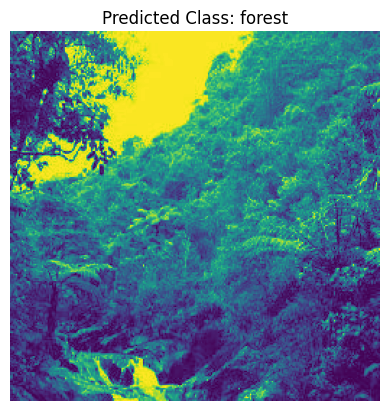

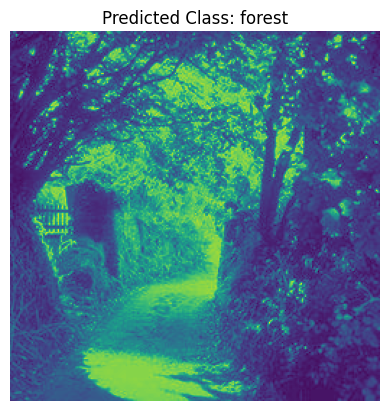

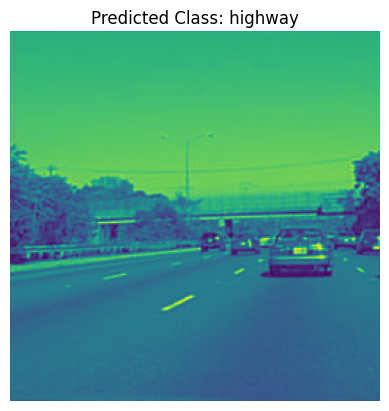

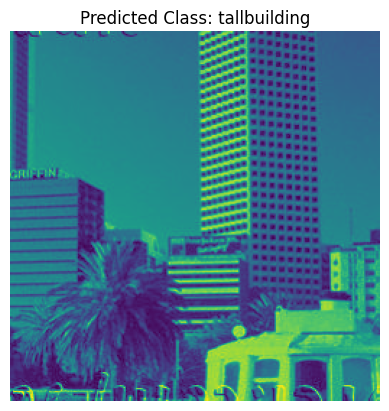

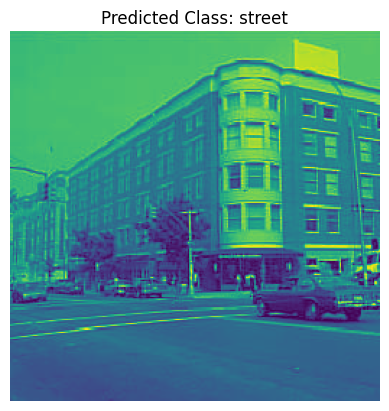

...

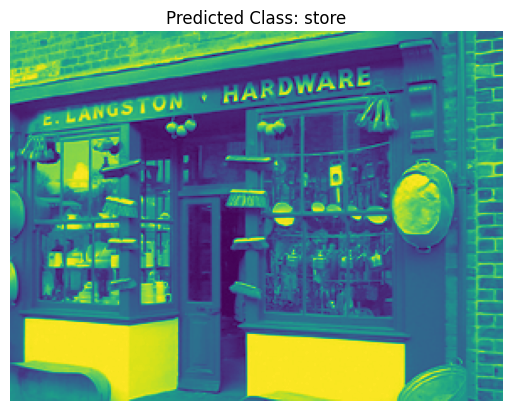

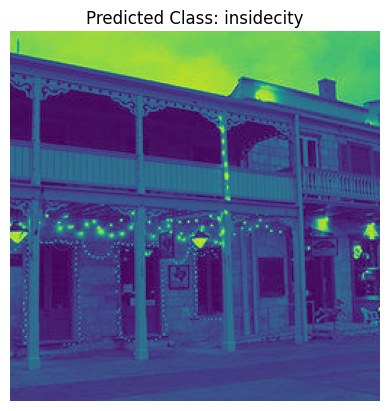

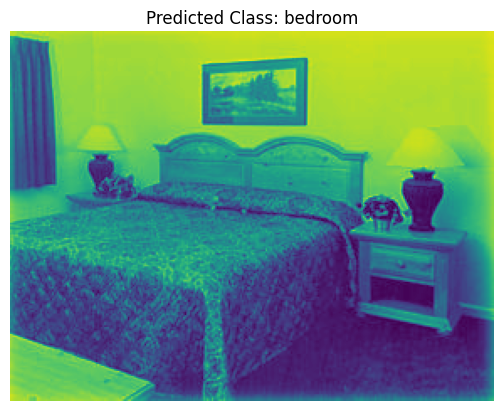

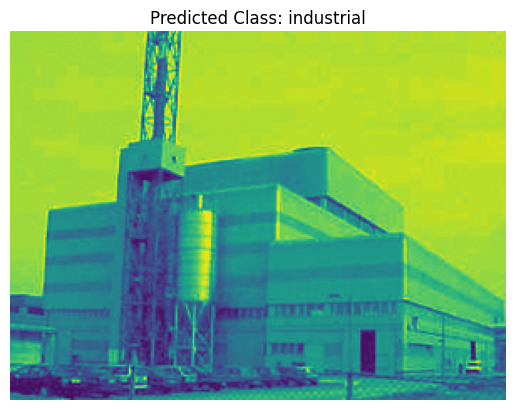

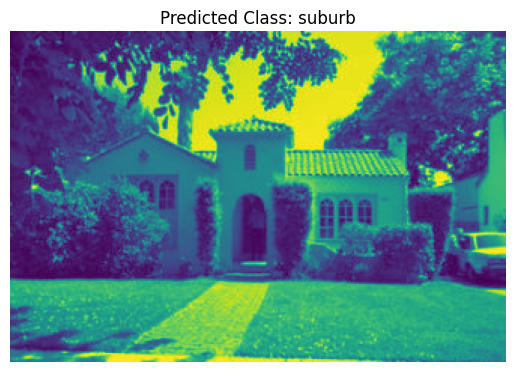

In [ ]:
for path in image_path:
    predict_image(path, model, svm, class_names)

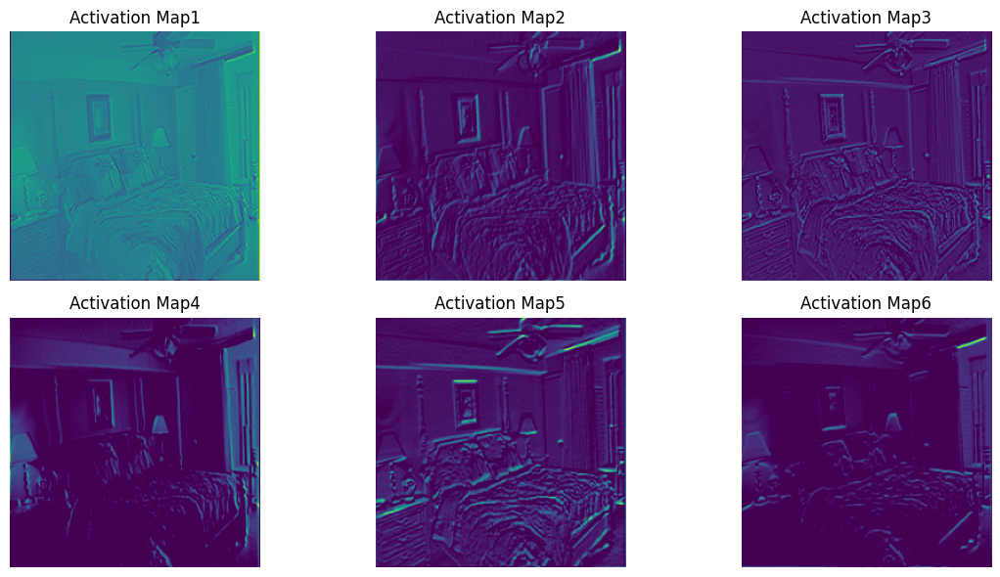

In [ ]:
activation_maps = {}

layer = 'convolution_1'
def hook_fn(module, input, output):
    global layer
    activation_maps[layer] = output

#hook the last layer
conv1_layer = model.features[0]
conv1_layer.register_forward_hook(hook_fn)

output = model(img)
activations = activation_maps[layer].squeeze(0).detach().cpu().numpy()

plt.figure(figsize=(12, 6))
for i in range(6):
    plt.subplot(2, 3, i+1)
    plt.imshow(activations[i])
    plt.axis('off')
    plt.title(f'Activation Map{i+1}')
plt.tight_layout()
plt.show()

Instanciation de VGG16
Instanciation de VGG16relu6
Récupération des données
Feature extraction
Batch 000/188
Batch 050/188
Batch 100/188
Batch 150/188
Batch 000/374
Batch 050/374
Batch 100/374
Batch 150/374
Batch 200/374
Batch 250/374
Batch 300/374
Batch 350/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1243: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Training for relu1 took 37.0251
Train Accuracy = 1.000000
Test Accuracy = 0.901508
Testing on a single image:


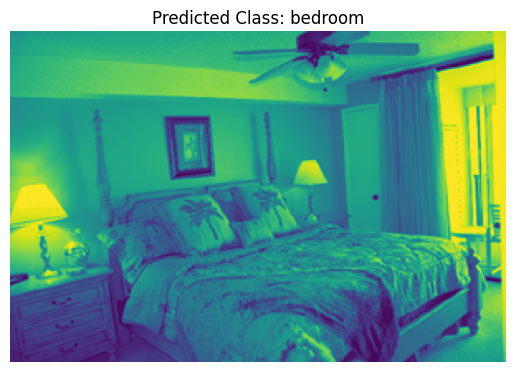

Testing on a single image with relu1 took 0.3870


In [ ]:
class VGG16relu1(nn.Module):
    def __init__(self):
        super(VGG16relu1, self).__init__()
        # Copy the entire convolutional part
        self.features = nn.Sequential(*list(vgg16.features.children()))
        # Keep a piece of the classifier: 2 to stop at relu1
        self.classifier = nn.Sequential(*list(vgg16.classifier.children())[:2])

    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

batch_size=8
mu = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
sigma = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
test_image_path="/content/15SceneData/test/bedroom/image_0008.jpg"
tick= time.time()
print('Instanciation de VGG16')
vgg16 = models.vgg16(pretrained=True)

print('Instanciation de VGG16relu6')
model = VGG16relu1()

model.eval()
if CUDA:
    cudnn.benchmark = True
    model = model.cuda()

path="15SceneData"

print('Récupération des données')
train_loader, test_loader = get_dataset(batch_size, path)
train_dataset = train_loader.dataset

print('Feature extraction')
X_train, y_train = extract_features(train_loader, model)
X_test, y_test = extract_features(test_loader, model)

print('Apprentissage des SVM')
svm = LinearSVC(C=1.0)
svm.fit(X_train, y_train)
tock = time.time()
print(f"Training for relu1 took {tock - tick:.4f}")
accuracy = svm.score(X_train,y_train)
print('Train Accuracy = %f' % accuracy)
accuracy = svm.score(X_test, y_test)
print('Test Accuracy = %f' % accuracy)


print("Testing on a single image:")
class_names = train_dataset.classes
tick = time.time()
predict_image(test_image_path, model, svm, class_names)
tock = time.time()
print(f"Testing on a single image with relu1 took {tock - tick:.4f}")


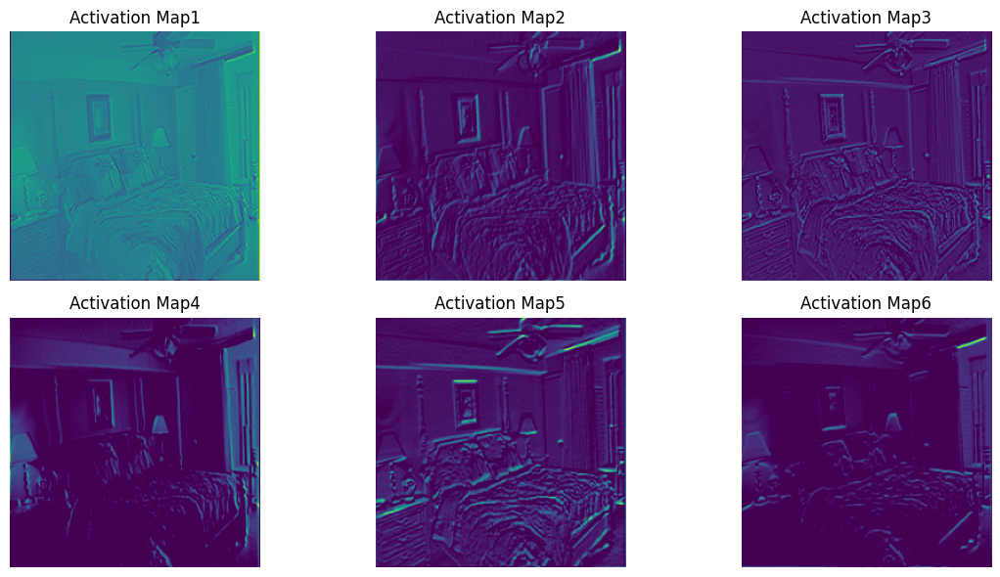

In [ ]:
activation_maps = {}

layer = 'convolution_1'
def hook_fn(module, input, output):
    global layer
    activation_maps[layer] = output

#hook the last layer
conv1_layer = model.features[0]
conv1_layer.register_forward_hook(hook_fn)

img = Image.open("/content/15SceneData/test/bedroom/image_0008.jpg").convert("RGB")
img = img.resize((224, 224), Image.BILINEAR)
img = np.array(img, dtype=np.float32) / 255.0
img = img.transpose((2, 0, 1))
img = torch.tensor(img, dtype=torch.float32)

mu = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
sigma = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
img = (img - mu) / sigma
img = img.unsqueeze(0)

if CUDA:
    img = img.cuda()

output = model(img)
activations = activation_maps[layer].squeeze(0).detach().cpu().numpy()

plt.figure(figsize=(12, 6))
for i in range(6):
    plt.subplot(2, 3, i+1)
    plt.imshow(activations[i])
    plt.axis('off')
    plt.title(f'Activation Map{i+1}')
plt.tight_layout()
plt.show()

Try other available pre-trained networks. What are the differences between these networks?

Instanciation de AlexNet


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Récupération des données
Feature extraction
Batch 000/188
Batch 050/188
Batch 100/188
Batch 150/188
Batch 000/374
Batch 050/374
Batch 100/374
Batch 150/374
Batch 200/374
Batch 250/374
Batch 300/374
Batch 350/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1243: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Main for AlexNet took 23.9372
Train Accuracy = 1.000000
Test Accuracy = 0.862647
Testing on a single image:


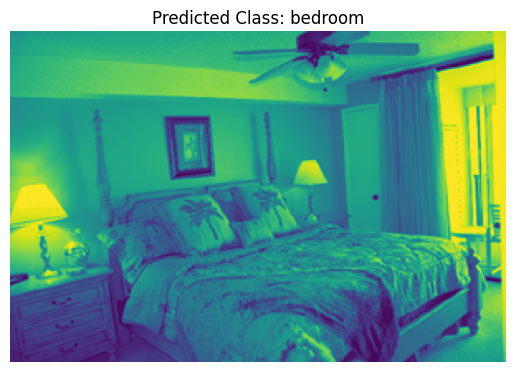

Testing on a single image with AlexNet took 0.2382
Instanciation de ResNet50


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Récupération des données
Feature extraction
Batch 000/188
Batch 050/188
Batch 100/188
Batch 150/188
Batch 000/374
Batch 050/374
Batch 100/374
Batch 150/374
Batch 200/374
Batch 250/374
Batch 300/374
Batch 350/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1243: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Main for ResNet50 took 25.9784
Train Accuracy = 1.000000
Test Accuracy = 0.908208
Testing on a single image:


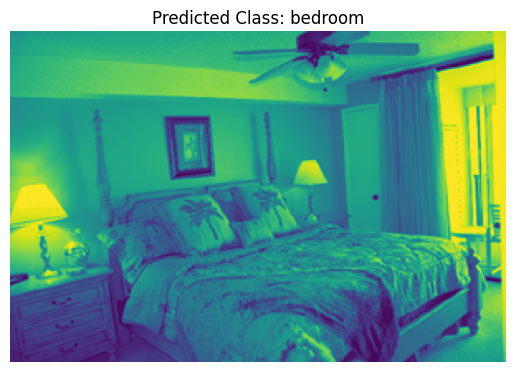

Testing on a single image with ResNet50 took 0.2343


In [47]:

def main_alexnet(path="15SceneData", test_image_path="/content/15SceneData/test/bedroom/image_0008.jpg", batch_size=8):
    tick = time.time()
    print('Instanciation de AlexNet')
    alexnet = models.alexnet(pretrained=True)
    alexnet.classifier = nn.Sequential(*list(alexnet.classifier.children())[:-1])

    model = alexnet
    model.eval()
    if CUDA:
        cudnn.benchmark = True
        model = model.cuda()

    print('Récupération des données')
    train, test = get_dataset(batch_size, path)
    train_loader, test_loader = get_dataset(batch_size, path)
    train_dataset = train_loader.dataset
    class_names = train_dataset.classes

    print('Feature extraction')
    X_train, y_train = extract_features(train, model)
    X_test, y_test = extract_features(test, model)

    print('Apprentissage des SVM')
    svm = LinearSVC(C=1.0)
    svm.fit(X_train, y_train)
    tock = time.time()
    print(f"Main for AlexNet took {tock - tick:.4f}")
    accuracy = svm.score(X_train,y_train)
    print('Train Accuracy = %f' % accuracy)
    accuracy = svm.score(X_test, y_test)
    print('Test Accuracy = %f' % accuracy)


    print("Testing on a single image:")
    tick = time.time()
    predict_image(test_image_path, model, svm, class_names)
    tock = time.time()
    print(f"Testing on a single image with AlexNet took {tock - tick:.4f}")




def main_resnet50(path="15SceneData", test_image_path="/content/15SceneData/test/bedroom/image_0008.jpg", batch_size=8):
    tick = time.time()
    print('Instanciation de ResNet50')
    resnet50 = models.resnet50(pretrained=True)

    resnet50.fc = nn.Identity()

    model = resnet50
    model.eval()

    if CUDA:
        cudnn.benchmark = True
        model = model.cuda()
    print('Récupération des données')
    train, test = get_dataset(batch_size, path)
    train_loader, test_loader = get_dataset(batch_size, path)
    train_dataset = train_loader.dataset
    class_names = train_dataset.classes
    print('Feature extraction')
    X_train, y_train = extract_features(train, model)
    X_test, y_test = extract_features(test, model)

    print('Apprentissage des SVM')
    svm = LinearSVC(C=1.0)
    svm.fit(X_train, y_train)
    tock = time.time()
    print(f"Main for ResNet50 took {tock - tick:.4f}")
    accuracy = svm.score(X_train,y_train)
    print('Train Accuracy = %f' % accuracy)
    accuracy = svm.score(X_test, y_test)
    print('Test Accuracy = %f' % accuracy)


    print("Testing on a single image:")
    tick = time.time()
    predict_image(test_image_path, model, svm, class_names)
    tock = time.time()
    print(f"Testing on a single image with ResNet50 took {tock - tick:.4f}")


main_alexnet()
main_resnet50()

Tune the parameter C to improve performance.

In [52]:
#tuning C with vgg relu7
from sklearn.model_selection import GridSearchCV
def main(path="15SceneData", test_image_path="/content/15SceneData/test/bedroom/image_0008.jpg",batch_size=8):
    tick = time.time()
    print('Instanciation de VGG16')
    vgg16 = models.vgg16(pretrained=True)

    print('Instanciation de VGG16relu7')
    model = VGG16relu7()

    model.eval()
    if CUDA:
        cudnn.benchmark = True
        model = model.cuda()

    print('Récupération des données')
    train_loader, test_loader = get_dataset(batch_size, path)
    train_dataset = train_loader.dataset

    print('Feature extraction')
    X_train, y_train = extract_features(train_loader, model)
    X_test, y_test = extract_features(test_loader, model)

    print('Apprentissage des SVM')
    Cs = [0, 0.0001, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 0.7, 1, 5, 10]
    param_grid = {'C': Cs}
    svm = LinearSVC()
    grid_search = GridSearchCV(svm, param_grid, cv=5, scoring='accuracy')

    grid_search.fit(X_train, y_train)
    results = grid_search.cv_results_

    mean_test_scores = results['mean_test_score']

    plt.figure(figsize=(8, 6))
    plt.plot(Cs, mean_test_scores, marker='o')
    plt.xscale('log')
    plt.xlabel('C')
    plt.ylabel('Mean Cross-Validation Accuracy')
    plt.title('Accuracy vs. C')
    plt.grid(True)
    plt.show()

    print("Best parameters: ", grid_search.best_params_)
    print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))

    best_svm = grid_search.best_estimator_
    accuracy = best_svm.score(X_test, y_test)
    print('Accuracy with best C = %f' % accuracy)

    print("Testing on the best C:")
    class_names = train_dataset.classes
    tick = time.time()
    predict_image(test_image_path, model, best_svm, class_names)
    tock = time.time()
    print(f"Testing on a single image with relu7 took {tock - tick:.4f}")

Instanciation de VGG16
Instanciation de VGG16relu7
Récupération des données
Feature extraction
Batch 000/188
Batch 050/188
Batch 100/188
Batch 150/188
Batch 000/374
Batch 050/374
Batch 100/374
Batch 150/374
Batch 200/374
Batch 250/374
Batch 300/374
Batch 350/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1243: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1243: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1243: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1243: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1243: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1243: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  w

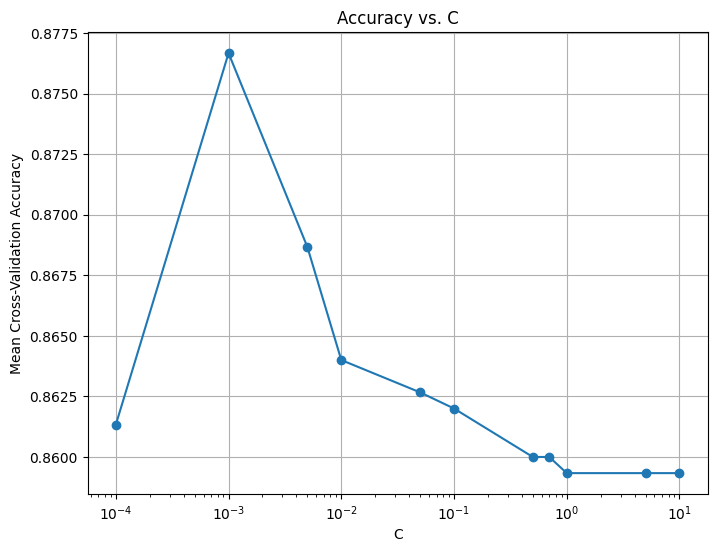

Best parameters:  {'C': 0.001}
Best cross-validation score: 0.88
Accuracy with best C = 0.889112
Testing on the best C:


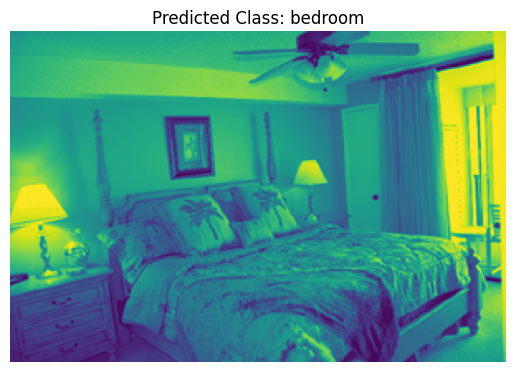

Testing on a single image with relu7 took 0.2319


In [53]:
main()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Prediction: four-poster
Prediction took 0.0003


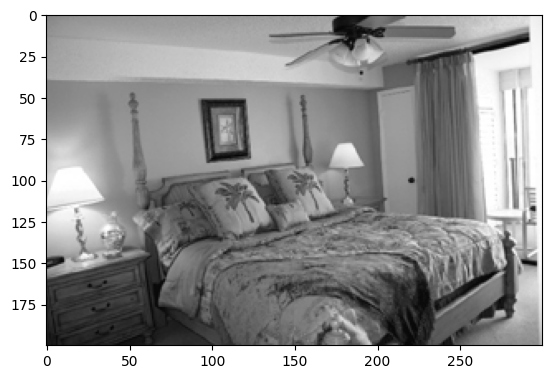

In [ ]:
#trying original vgg on the same image
nameim = "/content/15SceneData/test/bedroom/image_0008.jpg"
#cat = Image.open('cat.jpg')
img = Image.open(nameim).convert('RGB')
plt.imshow(img)

# Loading ImageNet classes
imagenet_classes = pickle.load(open('imagenet_classes.pkl', 'rb'))

# Normalization
img = img.resize((224, 224), Image.BILINEAR)
img = np.array(img, dtype=np.float32) / 255
img = img.transpose((2, 0, 1))
# ImageNet mean/std
mu = torch.Tensor([0.485, 0.456, 0.406])
sigma = torch.Tensor([0.229, 0.224, 0.225])
# Expand mu & sigma to match image size
# YOUR CODE HERE
mu = mu.view(3, 1, 1) # channels height width dimensions
sigma = sigma.view(3, 1, 1)
# compute the normalized image with mean ImageNet image
# img = YOUR CODE HERE
img =  transforms.Normalize(mu, sigma)(torch.Tensor(img))

# Loding pre-trained VGG
vgg16 = torchvision.models.vgg16(pretrained=True)
vgg16.eval() # WHY THAT ?

# Forward pass on VGG
img = np.expand_dims(img, 0)
x = torch.Tensor(img)
y = vgg16(x).detach()# TODO calcul forward
y = y.numpy() # transformation en array numpy

# Get prediction (i.e., ImageNet class label)
# YOUR CODE HERE
tick = time.time()
pred = np.argmax(y)
print(f'Prediction: {imagenet_classes[pred]}')
tock = time.time()
print(f"Prediction took {tock - tick:.4f}")